# 05 - Kaggle: Global Wheat Detection

After successfully applying Detectron2 on my custom dataset of musical instruments, I wanted to find a real world challenge that object detection can address. The first place I looked for was Kaggle and there I found [Global Wheat Detection](https://www.kaggle.com/c/global-wheat-detection).

![](https://storage.googleapis.com/kaggle-media/competitions/UofS-Wheat/descriptionimage.png)

With accurate wheat head detection, farmers can use field images to assess health and maturity of their wheat fields when making management decisions in their fields.

> The Global Wheat Head Dataset is led by nine research institutes from seven countries. These institutions are joined by many in their pursuit of accurate wheat head detection, including the Global Institute for Food Security, DigitAg, Kubota, and Hiphen. In this competition, you'll detect wheat heads from outdoor images of wheat plants, including wheat datasets from around the globe. Using worldwide data, you will focus on a generalized solution to estimate the number and size of wheat heads. You will use more than 3,000 images from Europe (France, UK, Switzerland) and North America (Canada). The test data includes about 1,000 images from Australia, Japan, and China.

In [1]:
%cd wheat-detection

/mnt/data/object_detection/wheat-detection


In [2]:
import numpy as np
import pandas as pd
import cv2, ast, glob
import detectron2
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor

## 1. Data

### Download

We can follow [this tutorial](https://github.com/Kaggle/kaggle-api) to install Kaggle API and use it to download the dataset.

```python
# Create folder wheat-detection to save the datasets
!mkdir -p ./wheat-detection
!kaggle competitions download global-wheat-detection -p wheat-detection

%cd wheat-detection
!unzip global-wheat-detection.zip
```

## Explore

In [3]:
train_df = pd.read_csv('train.csv')
train_df.head(3)

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1


In [4]:
train_df.bbox[:3]

0     [834.0, 222.0, 56.0, 36.0]
1    [226.0, 548.0, 130.0, 58.0]
2    [377.0, 504.0, 74.0, 160.0]
Name: bbox, dtype: object

Column `bbox` is in string format. We can use `ast.literal_eval` to convert it to `list[int]` - `[xmin, ymin, width, height]`.

In [5]:
train_df['bbox'][:3].apply(ast.literal_eval).tolist()

[[834.0, 222.0, 56.0, 36.0],
 [226.0, 548.0, 130.0, 58.0],
 [377.0, 504.0, 74.0, 160.0]]

There are 147793 wheat heads in 3373 images.

In [6]:
train_df.shape, train_df['image_id'].nunique()

((147793, 5), 3373)

All images have the same size 1024x1024.

In [8]:
train_df.width.unique(), train_df.height.unique()

(array([1024]), array([1024]))

### Train Test Split

We use 10% of training images as a validation set.

In [10]:
all_images = train_df['image_id'].unique().tolist()
train_images = np.random.choice(all_images, size=int(len(all_images) * 0.1)).tolist()

In [11]:
# Split
annot_train = train_df[train_df['image_id'].isin(train_images)]
annot_train.to_csv('annot_train.csv', index=False)
annot_val = train_df[~train_df['image_id'].isin(train_images)]
annot_val.to_csv('annot_val.csv', index=False)

## 2. Format Annotations

In [12]:
from tqdm import tqdm
import matplotlib.pyplot as plt

# detectron2
import detectron2
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.structures import BoxMode

bbox - a bounding box, formatted as a Python-style list of [xmin, ymin, width, height]

In [13]:
def get_detectron_dicts(annot_path):
    """
    Create a Detectron2's standard dataset dicts from an annotation file.
    
    Args:
        annot_path (str): path to the annotation file.
    Return:
        dataset_dicts (list[dict]): List of annotation dictionaries for Detectron2.
    """
    # Load annotation DataFrame
    annot_df = pd.read_csv(annot_path)
    
    # Get all images in `annot_df`
    img_ids = annot_df["image_id"].unique().tolist()
    
    # Convert `bbox` column from string to list
    annot_df['bbox'] = annot_df['bbox'].apply(ast.literal_eval)
    
    dataset_dicts = []
    for img_id in tqdm(img_ids):
        file_name = f'train/{img_id}.jpg'
            
        record = {}
        record['file_name'] = file_name
        record['image_id'] = img_id
        record['height'] = 1024
        record['width'] = 1024
        
        # Get bboxes
        bboxes = annot_df[annot_df['image_id'] == img_id]['bbox']
        
        annots = []
        for bbox in bboxes:
            annot = {
                "bbox": bbox,
                "bbox_mode": BoxMode.XYWH_ABS,
                "category_id": 0,
            }
            annots.append(annot)

        record["annotations"] = annots
        dataset_dicts.append(record)
    return dataset_dicts

### Visualize Bounding Boxes

In [14]:
dataset_dicts = get_detectron_dicts("annot_train.csv")
metadata = detectron2.data.catalog.Metadata(thing_classes=["Wheat"])

100%|██████████| 319/319 [00:00<00:00, 634.05it/s]


In [15]:
def cv2_imshow(im):
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(20, 10))
    plt.imshow(im), plt.axis('off');

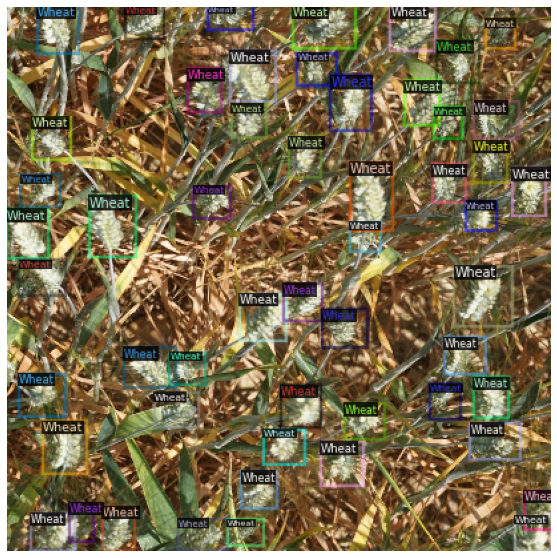

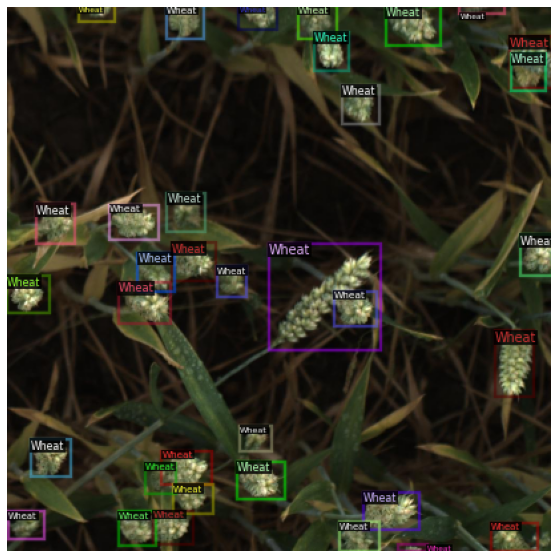

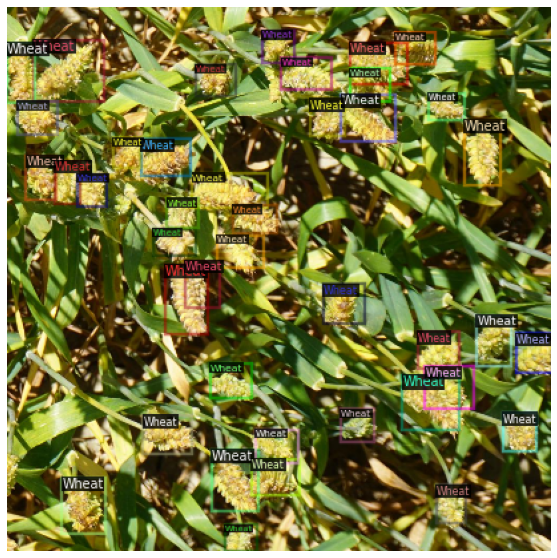

In [20]:
for d in np.random.choice(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.4)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1]);

## 3. Train Detectron2

Once we have defined a function to format the datasets into Detectron2's standard dataset, training process will be the same as before. I have prepared `main.py` script to run training and evaluation.

In [ ]:
cmd = """python main.py \
    --train \
    --train_annot_fp "./annot_train.csv" \
    --eval \
    --val_annot_fp "./annot_val.csv" \
    --model "faster_rcnn_X_101_32x8d_FPN_3x" \
    --max_iter 40000 \
    --lr 5e-4 \
    --gamma 0.5 \
    --lr_decay_steps 40000"""

!{cmd}

Here is the [TensorBoard](https://tensorboard.dev/experiment/gvKPDSqMTL2Pv1LzBXpm0Q/#scalars) of experiment and final training.

Final model's result:

In [21]:
!cat "retinanet_R_101_FPN_3x__iter-40000__lr-0.0005/eval_results.json"

{"bbox": {"AP": 52.72797315666854, "AP50": 89.99590194866948, "AP75": 55.624661922503826, "APs": 2.9702970297029703, "APm": 51.95762535996119, "APl": 58.02799416976426}}

## 4. Predict

Now let's see how our trained model make predictions on the test set.

In [22]:
def cv2_imshow(im):
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(20, 10)), plt.imshow(im), plt.axis('off');
    
def detect(pil_im, predictor):
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1], metadata, scale=0.5)
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

There are 10 images on the test set provided by Kaggle.

In [23]:
test_images = glob.glob("test/*")
len(test_images)

10

In [24]:
# Load model
model_dir = "retinanet_R_101_FPN_3x__iter-40000__lr-0.0005"
cfg = get_cfg()
cfg.merge_from_file(model_dir + '/config.yaml')
cfg.MODEL.WEIGHTS = model_dir + '/model_final.pth'
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.5
predictor = DefaultPredictor(cfg)

# Set up metadata
metadata = detectron2.data.catalog.Metadata(thing_classes=['Wheat'])

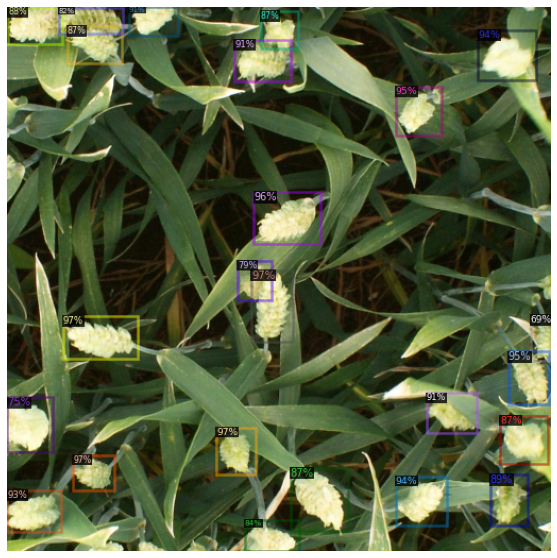

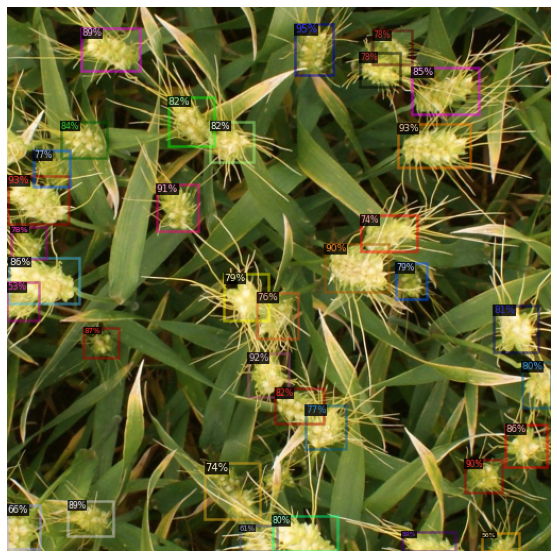

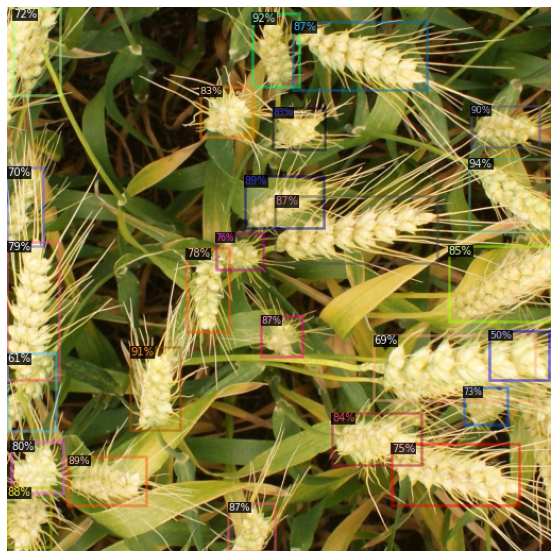

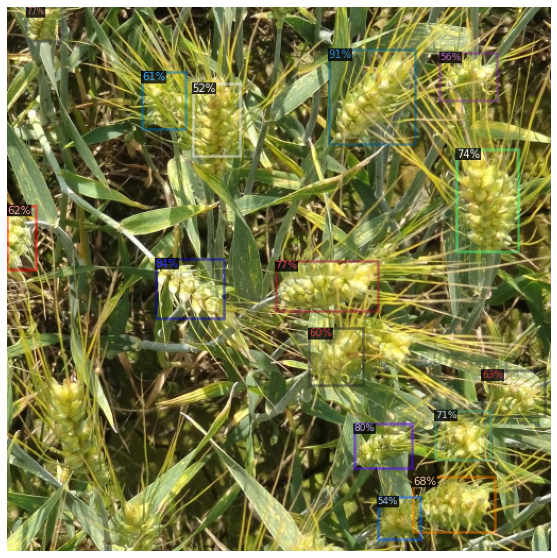

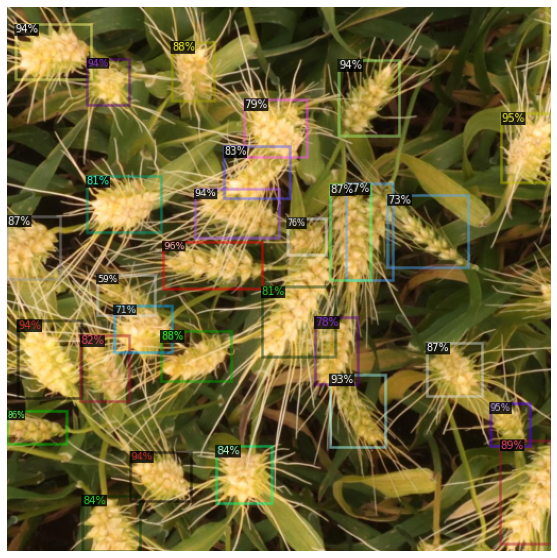

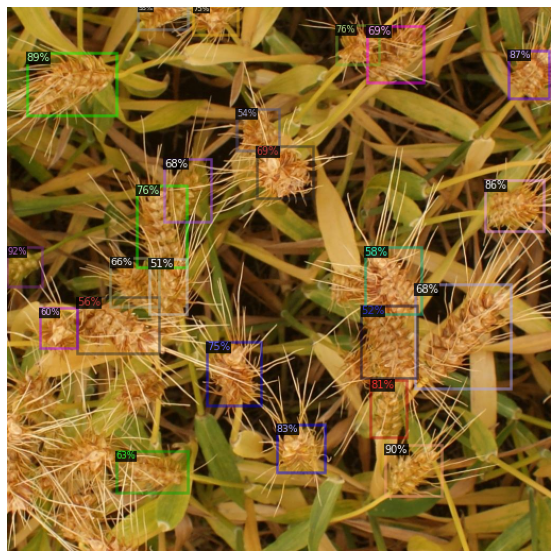

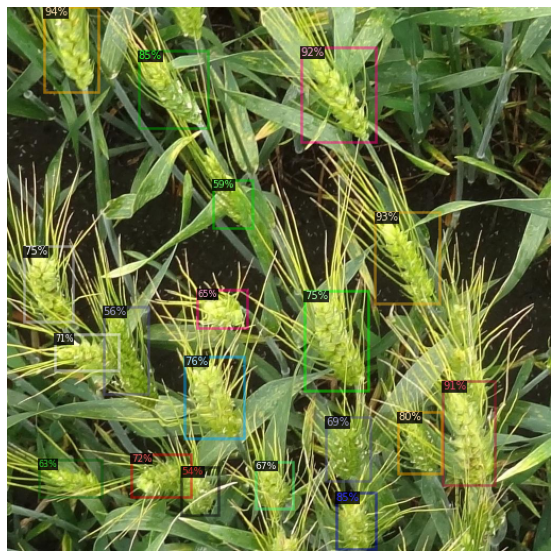

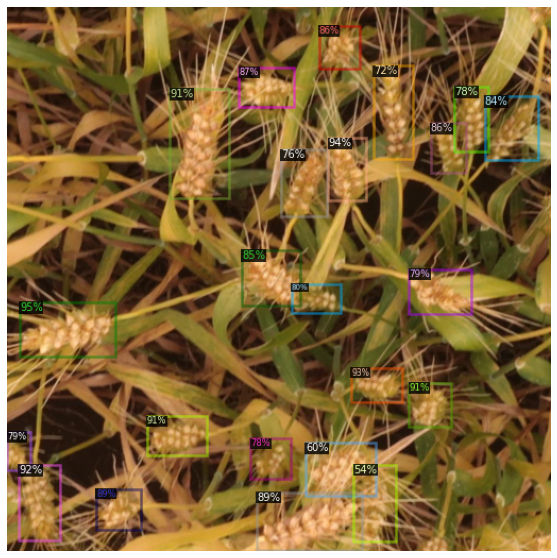

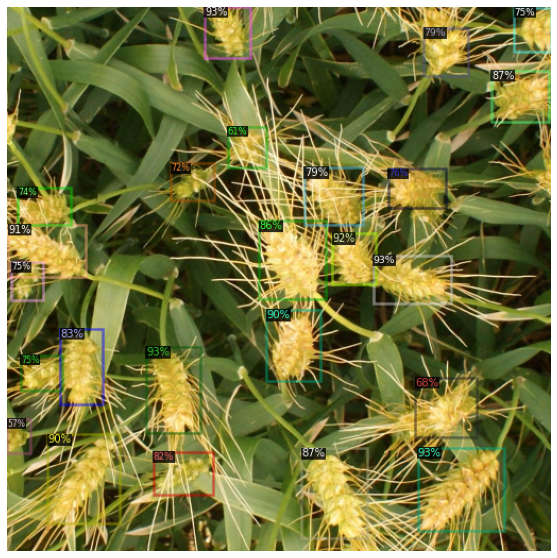

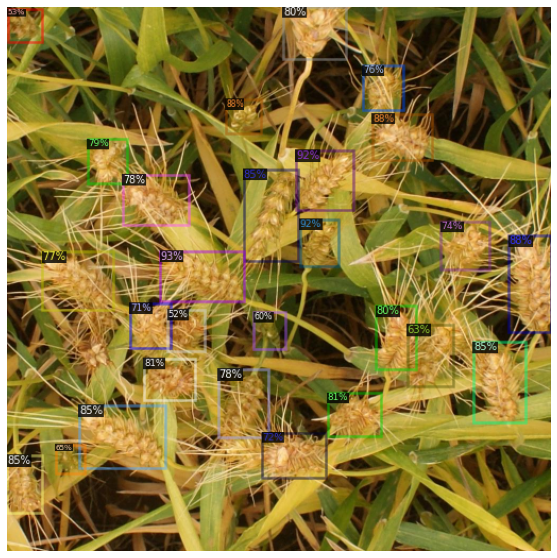

In [25]:
for img in test_images:
    im = cv2.imread(img)
    detect(im, predictor)

The model still misses some wheat heads but the overall result is promising. More data augmentation can be performed to improve the resultss; however, in the scope of this notebook, our goal is to see how we can apply Detectron2 to address a real world challenge.